<h1 align="center">Visual Behavior Neuropixels SWDB 2022 </h1>
<h3 align="center">Entrypoint</h3>

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec #Useful tool to arrange multiple plots in one figure (https://matplotlib.org/stable/api/_as_gen/matplotlib.gridspec.GridSpec.html)
from matplotlib.patches import Patch
from matplotlib.patches import Rectangle

from util import set_up_cache, get_session, plot_unit_spikes, plot_one_trial, plot_trials, plot_trials_chron, plot_trials_timeline, horizontal_bar_plot_trials, trials_data_description
from util_eda import get_missing_durations, create_unit_activity_vectors, plot_stimulus_presentations_with_activities, get_unit_activity_vectors_for_image, average_population_response_over_same_stimulus_presentations, count_same_image_appearences, extract_speed_and_pupil_data, plot_active_vs_passive_RS_running_speed_and_pupil_area_over_time, running_speeds_and_pupil_areas, count_all_same_image_appearences, construct_unit_activity_population_response_matrix
from util_RS_plots import specific_image, plot_layered_RS_running_speed_and_pupil_area_all_images, RS_vs_speed_active_passive, RS_vs_time_avg_active_passive, RS_vs_speed_avg_active_passive, correlation_between_picture_pair


%matplotlib inline

%load_ext autoreload
%autoreload 2
%aimport util

import util

/Users/kiracordes/opt/anaconda3/lib/python3.7/site-packages/requests/__init__.py:104: RequestsDependencyWarning: urllib3 (1.26.9) or chardet (5.0.0)/charset_normalizer (2.0.4) doesn't match a supported version!
  RequestsDependencyWarning)


In [2]:
cache = set_up_cache()

In [3]:
ecephys_sessions_table = cache.get_ecephys_session_table()
ecephys_sessions_table.sample(9)

,behavior_session_id,date_of_acquisition,equipment_name,session_type,mouse_id,genotype,sex,project_code,age_in_days,unit_count,...,channel_count,structure_acronyms,image_set,prior_exposures_to_image_set,session_number,experience_level,prior_exposures_to_omissions,file_id,abnormal_histology,abnormal_activity
ecephys_session_id,,,,,,,,,,,,,,,,,,,,,
1049514117,1049542142,2020-09-10 15:11:15.371000+00:00,NP.0,EPHYS_1_images_H_3uL_reward,521466,Vip-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt,F,NeuropixelVisualBehavior,194,1925.0,...,2304.0,"['APN', 'CA1', 'CA3', 'DG-mo', 'DG-po', 'DG-sg...",H,0.0,2,Novel,1,882,NaN,NaN
1104289498,1104327081,2021-05-20 14:45:32.653000+00:00,NP.0,EPHYS_1_images_H_3uL_reward,563497,Sst-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt,F,NeuropixelVisualBehavior,168,1103.0,...,2304.0,"['CA1', 'HPF', 'root', 'SUB', 'VISal', 'VISam'...",H,0.0,2,Novel,1,974,NaN,NaN
1109680280,1109709062,2021-06-16 13:53:18.572000+00:00,NP.1,EPHYS_1_images_H_3uL_reward,568022,wt/wt,M,NeuropixelVisualBehavior,160,1347.0,...,1152.0,"['CA1', 'DG-mo', 'DG-po', 'DG-sg', 'LP', 'MB',...",H,37.0,1,Familiar,0,985,NaN,NaN
1055240613,1055260435,2020-10-07 14:53:34.486000+00:00,NP.0,EPHYS_1_images_G_3uL_reward,533539,wt/wt,F,NeuropixelVisualBehavior,143,2290.0,...,2304.0,"['CA1', 'CA3', 'DG-mo', 'DG-po', 'DG-sg', 'HPF...",G,15.0,1,Familiar,0,893,NaN,NaN
1064415305,1064445631,2020-11-18 15:13:44.741000+00:00,NP.0,EPHYS_1_images_G_3uL_reward,536480,Vip-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt,M,NeuropixelVisualBehavior,169,2455.0,...,2304.0,"['APN', 'CA1', 'CA3', 'DG-mo', 'DG-po', 'DG-sg...",G,41.0,1,Familiar,0,907,NaN,NaN
1047969464,1048005547,2020-09-02 14:53:14.347000+00:00,NP.1,EPHYS_1_images_G_3uL_reward,509808,Sst-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt,M,NeuropixelVisualBehavior,263,2438.0,...,2304.0,"['APN', 'CA1', 'CA3', 'DG-mo', 'DG-po', 'DG-sg...",G,62.0,1,Familiar,0,877,NaN,NaN
1104297538,1104327579,2021-05-20 14:52:47.422000+00:00,NP.1,EPHYS_1_images_G_3uL_reward,560964,wt/wt,F,NeuropixelVisualBehavior,188,2160.0,...,2304.0,"['APN', 'CA1', 'CA3', 'DG-mo', 'DG-po', 'DG-sg...",G,0.0,2,Novel,1,975,NaN,NaN
1108528422,1108565586,2021-06-10 13:45:04.529000+00:00,NP.0,EPHYS_1_images_G_3uL_reward,571520,wt/wt,M,NeuropixelVisualBehavior,127,1349.0,...,2304.0,"['APN', 'CA1', 'CA3', 'DG-mo', 'DG-po', 'DG-sg...",G,0.0,2,Novel,1,983,NaN,NaN
1130349290,1130378962,2021-09-23 13:34:57.267000+00:00,NP.0,EPHYS_1_images_G_3uL_reward,579993,wt/wt,F,NeuropixelVisualBehavior,165,1928.0,...,2304.0,"['APN', 'CA1', 'CA3', 'DG-mo', 'DG-sg', 'HPF',...",G,0.0,2,Novel,1,1017,NaN,NaN


In [4]:
len(ecephys_sessions_table)

103

In [5]:
ecephys_sessions_table[ecephys_sessions_table['mouse_id']==524761]

,behavior_session_id,date_of_acquisition,equipment_name,session_type,mouse_id,genotype,sex,project_code,age_in_days,unit_count,...,channel_count,structure_acronyms,image_set,prior_exposures_to_image_set,session_number,experience_level,prior_exposures_to_omissions,file_id,abnormal_histology,abnormal_activity
ecephys_session_id,,,,,,,,,,,,,,,,,,,,,
1044385384,1044408432,2020-08-19 14:47:08.574000+00:00,NP.1,EPHYS_1_images_G_5uL_reward,524761,wt/wt,F,NeuropixelVisualBehavior,151,2179.0,...,1920.0,"['CA1', 'CA3', 'DG-mo', 'DG-po', 'DG-sg', 'LGv...",G,30.0,1,Familiar,0,870,NaN,NaN
1044594870,1044624428,2020-08-20 15:03:56.422000+00:00,NP.1,EPHYS_1_images_H_5uL_reward,524761,wt/wt,F,NeuropixelVisualBehavior,152,2103.0,...,1920.0,"['CA1', 'CA3', 'DG-mo', 'DG-po', 'DG-sg', 'HPF...",H,0.0,2,Novel,1,872,NaN,NaN


In [6]:
session = get_session(session_id=1044385384) # Familiar Session of Mouse with ID: 524761

In [7]:
session.metadata

/Users/kiracordes/opt/anaconda3/lib/python3.7/site-packages/allensdk/brain_observatory/behavior/data_objects/metadata/subject_metadata/full_genotype.py:57: UserWarning: Unable to parse cre_line from full_genotype
  warnings.warn('Unable to parse cre_line from full_genotype')


{'equipment_name': 'NP.1',
 'sex': 'F',
 'age_in_days': 151,
 'stimulus_frame_rate': 60.0,
 'session_type': 'EPHYS_1_images_G_5uL_reward',
 'date_of_acquisition': datetime.datetime(2020, 8, 19, 21, 47, 8, tzinfo=tzutc()),
 'reporter_line': None,
 'cre_line': None,
 'behavior_session_uuid': None,
 'driver_line': [],
 'mouse_id': 524761,
 'full_genotype': 'wt/wt',
 'behavior_session_id': 1044408432,
 'ecephys_session_id': 1044385384}

In [8]:
stimulus_presentations = session.stimulus_presentations
# This table is a record of every stimulus we presented to the mouse over the course of this experiment
print(len(stimulus_presentations))
# stimulus_presentations.tail()
stimulus_presentations.head()

13397


,active,color,contrast,duration,end_frame,flashes_since_change,image_name,is_change,is_image_novel,omitted,...,position_y,rewarded,spatial_frequency,start_frame,start_time,stimulus_block,stimulus_index,stimulus_name,stop_time,temporal_frequency
stimulus_presentations_id,,,,,,,,,,,,,,,,,,,,,
0,True,NaN,NaN,0.250204,75,0.0,im036_r,0.0,0.0,0.0,...,NaN,0.0,NaN,60,26.243883,0,NaN,Natural_Images_Lum_Matched_set_ophys_G_2019,26.494087,NaN
1,True,NaN,NaN,0.250204,120,1.0,im036_r,0.0,0.0,0.0,...,NaN,0.0,NaN,105,26.994494,0,NaN,Natural_Images_Lum_Matched_set_ophys_G_2019,27.244698,NaN
2,True,NaN,NaN,0.250211,165,2.0,im036_r,0.0,0.0,0.0,...,NaN,0.0,NaN,150,27.745120,0,NaN,Natural_Images_Lum_Matched_set_ophys_G_2019,27.995332,NaN
3,True,NaN,NaN,0.250209,210,3.0,im036_r,0.0,0.0,0.0,...,NaN,0.0,NaN,195,28.495752,0,NaN,Natural_Images_Lum_Matched_set_ophys_G_2019,28.745960,NaN
4,True,NaN,NaN,0.250214,255,4.0,im036_r,0.0,0.0,0.0,...,NaN,0.0,NaN,240,29.246378,0,NaN,Natural_Images_Lum_Matched_set_ophys_G_2019,29.496592,NaN


In [9]:
units = session.get_units()
# This table contains quality metrics and waveform metrics for every unit recorded during this session
units.head()

channels = session.get_channels()
# This table contains info about where each channel was in the brain as well as it's relative position along the probe.
channels.head(3)

# merge
units = units.merge(channels, left_on='peak_channel_id', right_index=True)
#units.head()

# how many units were recorded in each brain area for this session?
# units.value_counts('structure_acronym')

In [10]:
trials = session.trials
change_trials = trials[trials.is_change]
spike_times = session.spike_times
running_speed = session.running_speed
eye_tracking = session.eye_tracking

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

Now that we have our change times, we're almost ready to make our PSTH. Next we need to get spike times for a good unit. To start out, let's filter our units dataframe for 'good' units, based on the following criteria:
    <p> &emsp; a) <code>quality</code> == 'good'
            <p> &emsp; b) <code>firing_rate</code> > 1 Hz
            <p> &emsp; c) <code>snr</code> > 1
            <p> &emsp; d) <code>isi_violations</code> < 1
                                                         
Then we'll grab an example unit from this curated list
</div>

In [11]:
# Filter units by the quality criteria
good_units = units[(units['quality']=='good') &
                   (units['firing_rate']>1) &
                   (units['snr']>1) &
                   (units['isi_violations']<1)]

len(good_units)

1054

### good units are for now: 
units[(units['quality']=='good') & (units['firing_rate']>1) & (units['snr']>1) & (units['isi_violations']<1)]

In [12]:
good_units.head(2)

,PT_ratio,amplitude,amplitude_cutoff,cluster_id,cumulative_drift,d_prime,firing_rate,isi_violations,isolation_distance,l_ratio,...,waveform_duration,anterior_posterior_ccf_coordinate,dorsal_ventral_ccf_coordinate,filtering,left_right_ccf_coordinate,probe_channel_number,probe_horizontal_position,probe_id,probe_vertical_position,structure_acronym
id,,,,,,,,,,,,,,,,,,,,,
1049374910,0.001205,334.31424,0.003587,489,125.59,5.182430,8.577549,0.009934,70.970062,0.001430,...,0.796650,7935.0,925.0,AP band: 500 Hz high-pass; LFP band: 1000 Hz l...,7577.0,283,27,1044506933,2840,VISpm
1049373961,0.070936,204.71685,0.500000,172,209.73,2.680824,6.628461,0.073543,41.259415,0.041831,...,2.074037,8077.0,3260.0,AP band: 500 Hz high-pass; LFP band: 1000 Hz l...,7459.0,90,59,1044506933,920,LP


In [13]:
good_VISp_units = good_units[good_units['structure_acronym']=='VISp']
good_CA1_units = good_units[good_units['structure_acronym']=='CA1']
good_VIS_units = good_units[good_units['structure_acronym'].str.contains('VIS')]
len(good_CA1_units), len(good_VISp_units), len(good_VIS_units)

(193, 35, 367)

In [14]:
stimulus_presentations
(len(stimulus_presentations),len(stimulus_presentations[stimulus_presentations.stimulus_block == 0]))

(13397, 4800)

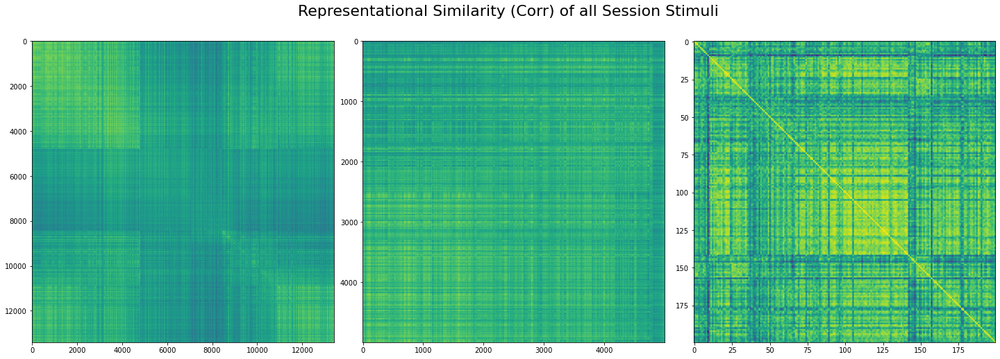

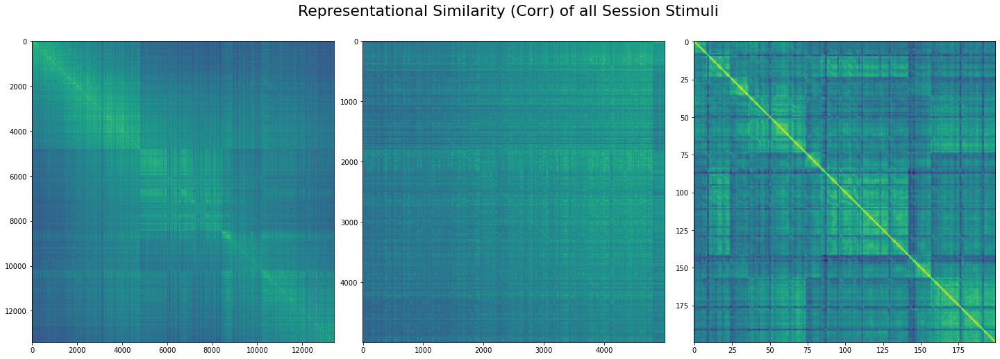

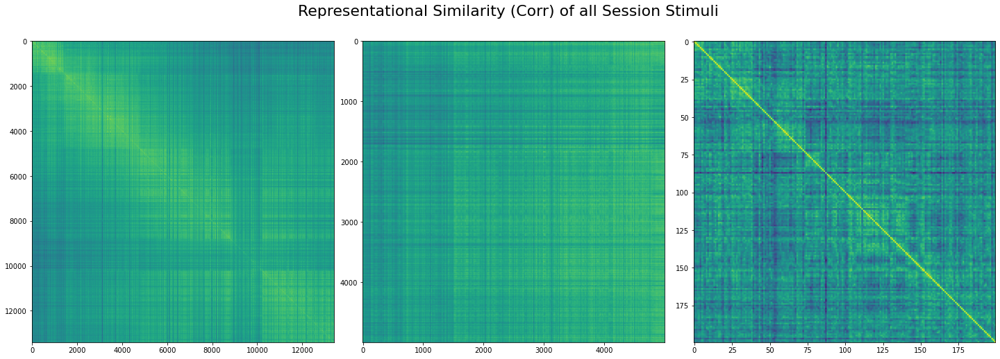

In [15]:
M_good_VISp = construct_unit_activity_population_response_matrix(good_VISp_units, spike_times, stimulus_presentations)
M_all_good = construct_unit_activity_population_response_matrix(good_units, spike_times, stimulus_presentations)
M_good_CA1 = construct_unit_activity_population_response_matrix(good_CA1_units, spike_times, stimulus_presentations)


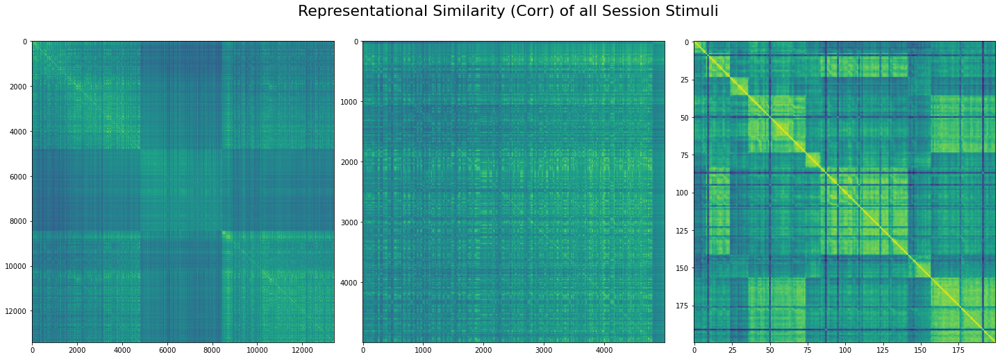

In [16]:
M_good_VIS = construct_unit_activity_population_response_matrix(good_VIS_units, spike_times, stimulus_presentations)

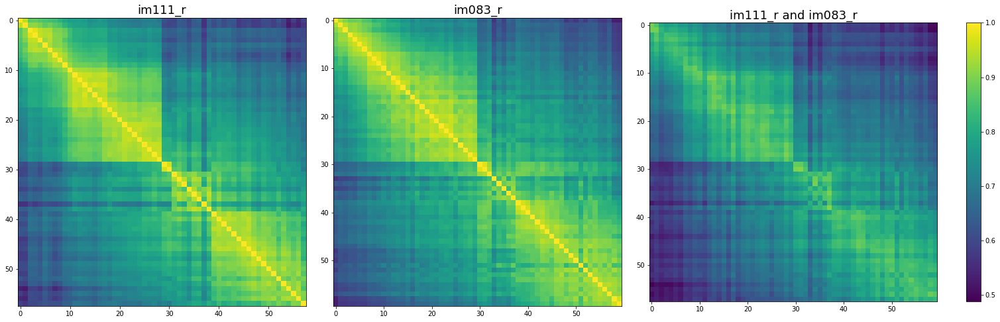

In [17]:
correlation_between_picture_pair('im111_r', 'im083_r', M_all_good, stimulus_presentations)

# Get Unit Activites for Fixed Images (averaged)

In [18]:
valid_images = []
for im in stimulus_presentations.image_name.unique():
    if (im != 'omitted') and (type(im) is not float):
        valid_images.append(im)
        
print(valid_images)


['im036_r', 'im111_r', 'im012_r', 'im083_r', 'im078_r', 'im047_r', 'im044_r', 'im115_r']


M_all_good:


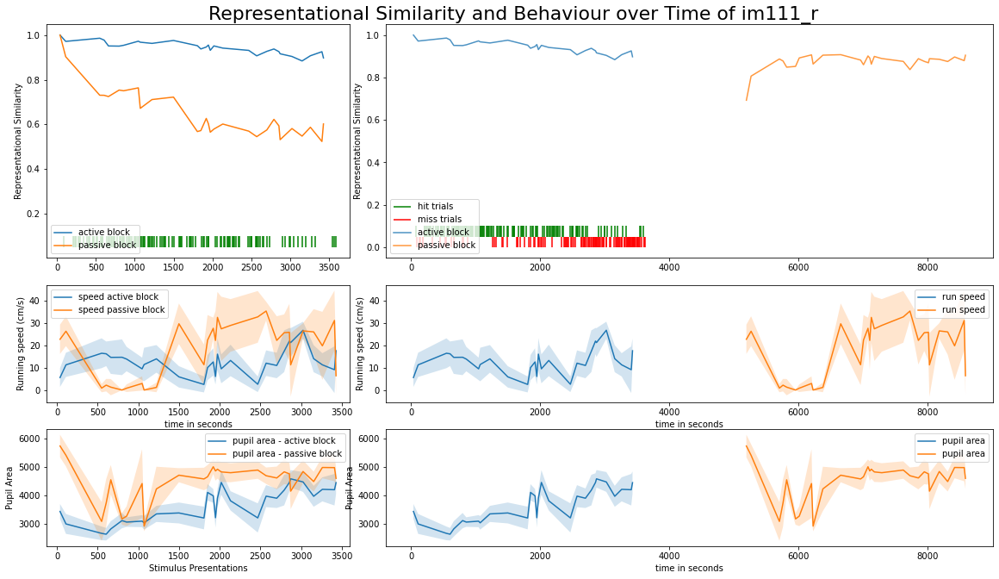

In [19]:
print('M_all_good:')
specific_image('im111_r', M_good_VISp, stimulus_presentations, running_speed, eye_tracking, change_trials)

In [20]:
colors = ['blue', 'orange', 'purple', 'firebrick', 'cornflowerblue', 'darkblue', 'magenta', 'green', 'thistle']

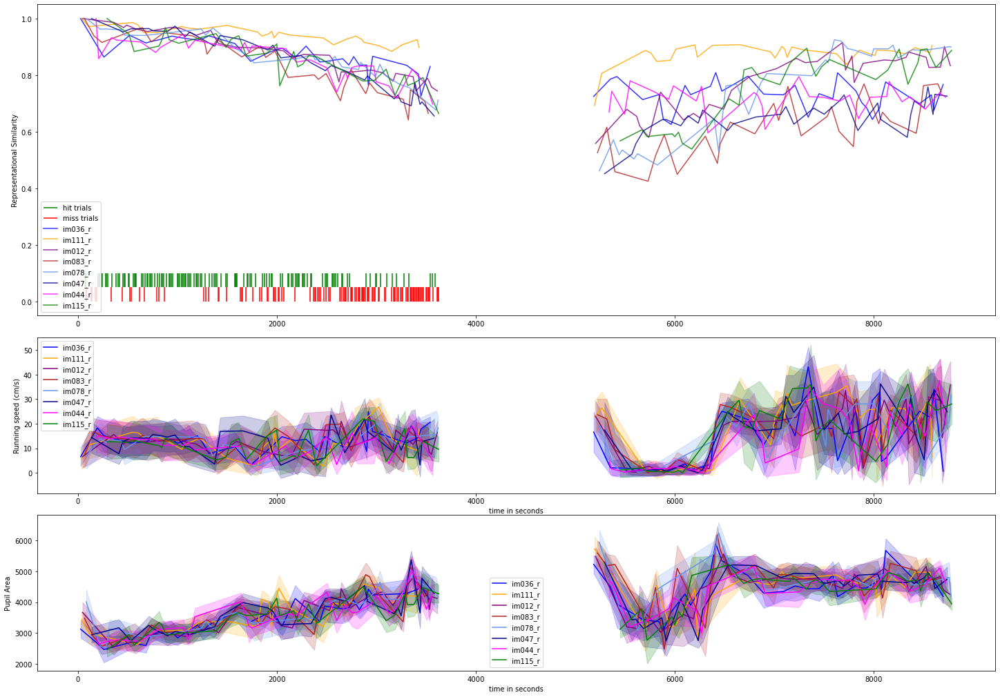

In [21]:
# print all images layered for M
plot_layered_RS_running_speed_and_pupil_area_all_images(valid_images, M_good_VISp, stimulus_presentations, running_speed, eye_tracking, colors, change_trials)


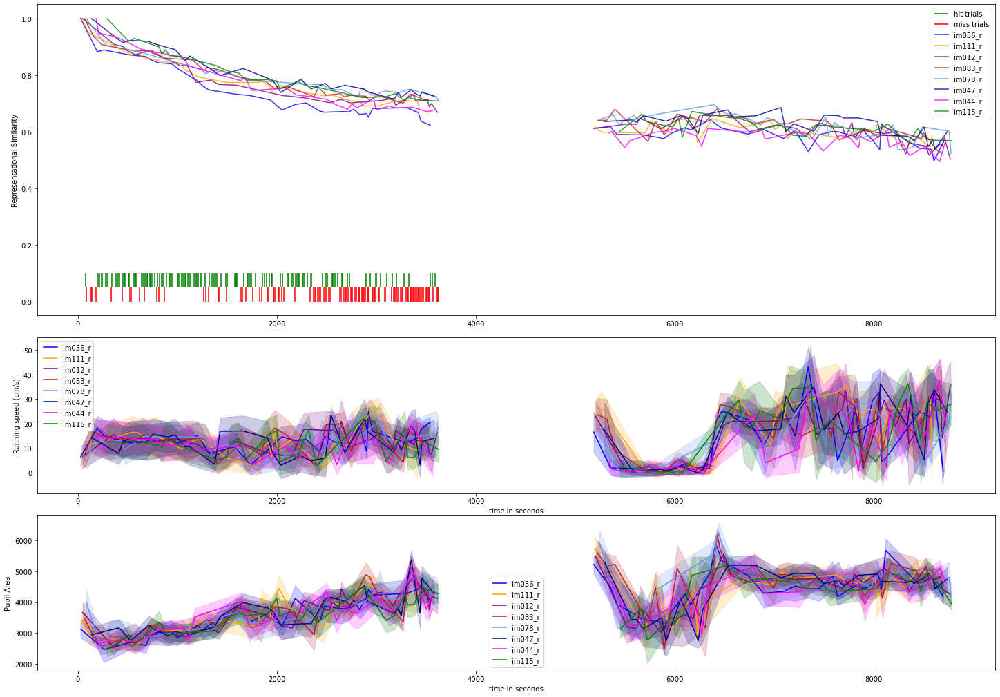

In [22]:
# print all images layered for M_all_good
plot_layered_RS_running_speed_and_pupil_area_all_images(valid_images, M_all_good, stimulus_presentations, running_speed, eye_tracking, colors, change_trials)



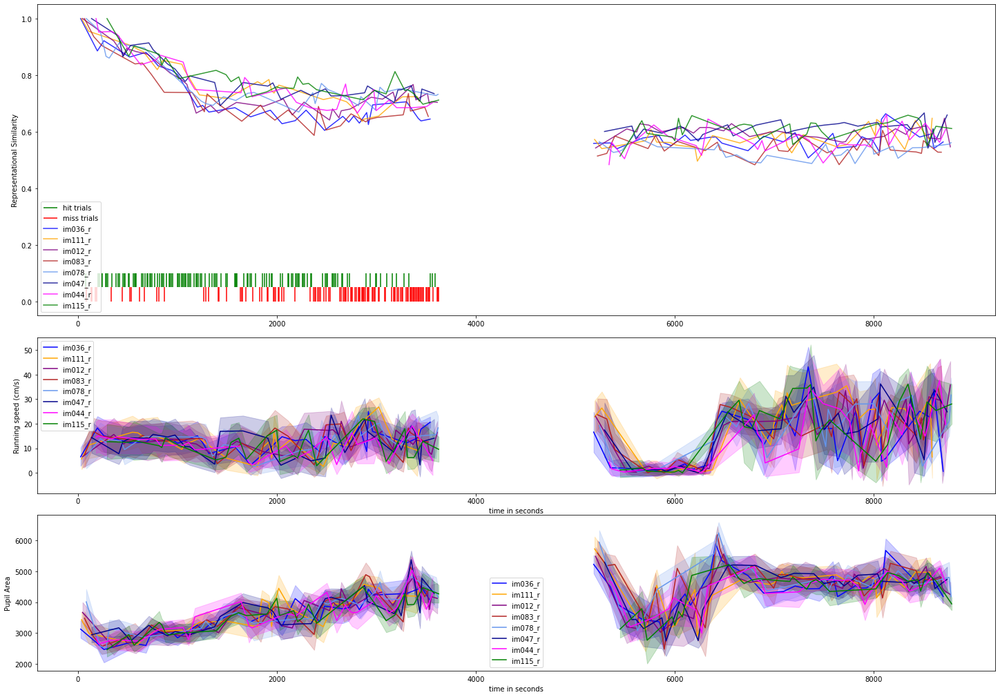

In [23]:
plot_layered_RS_running_speed_and_pupil_area_all_images(valid_images, M_good_CA1, stimulus_presentations, running_speed, eye_tracking, colors, change_trials)


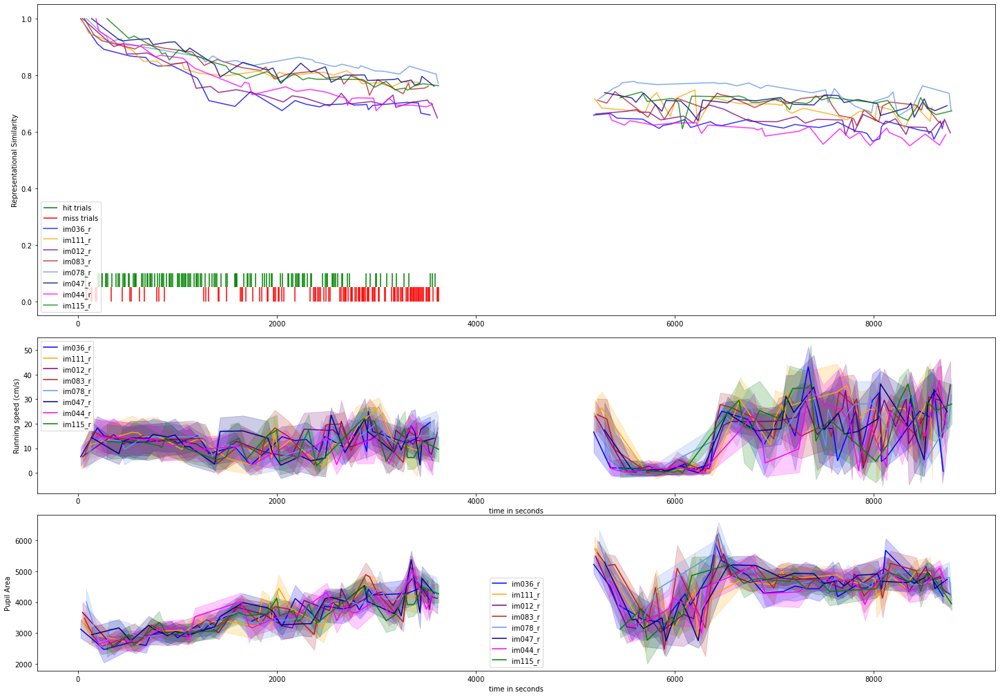

In [24]:
plot_layered_RS_running_speed_and_pupil_area_all_images(valid_images, M_good_VIS, stimulus_presentations, running_speed, eye_tracking, colors, change_trials)


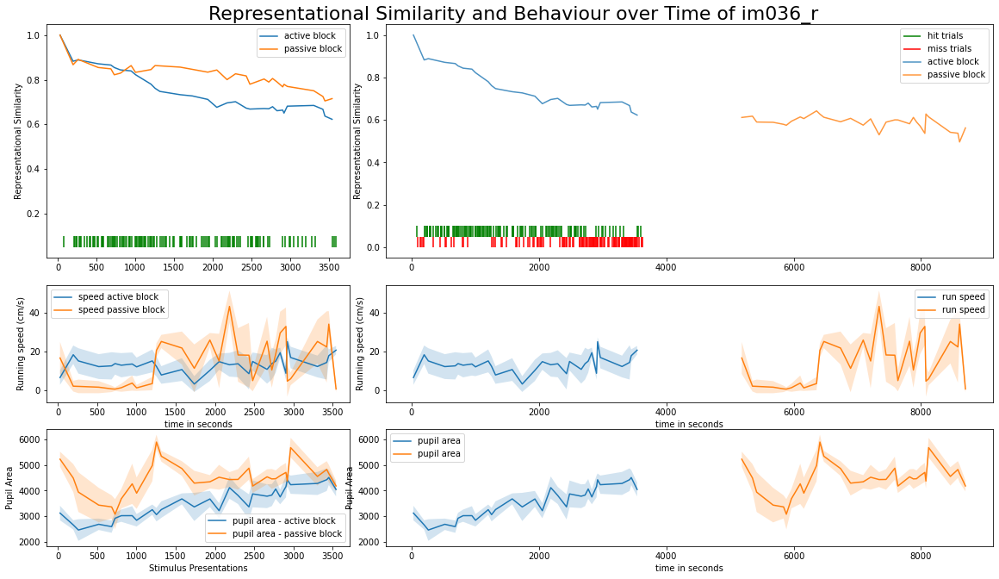

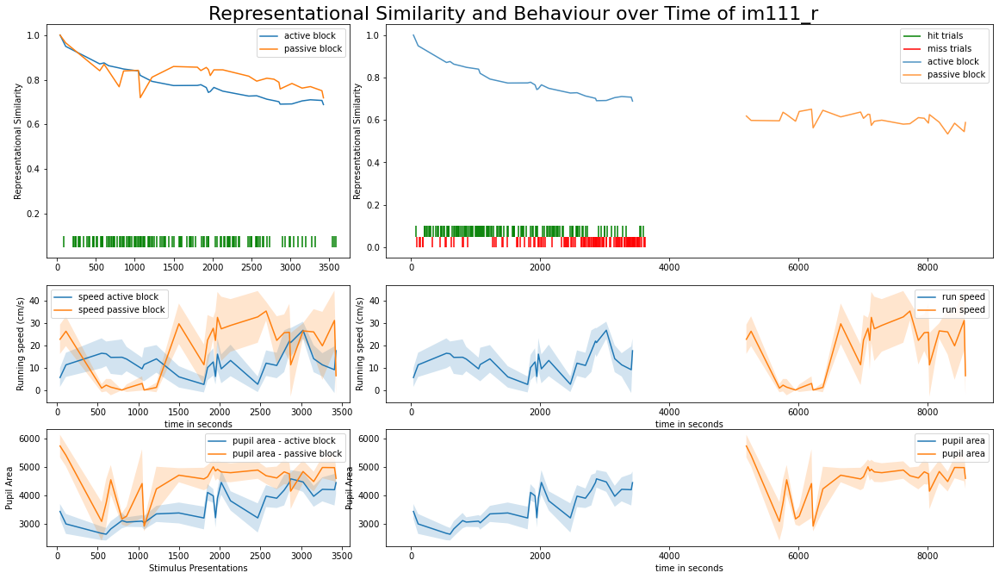

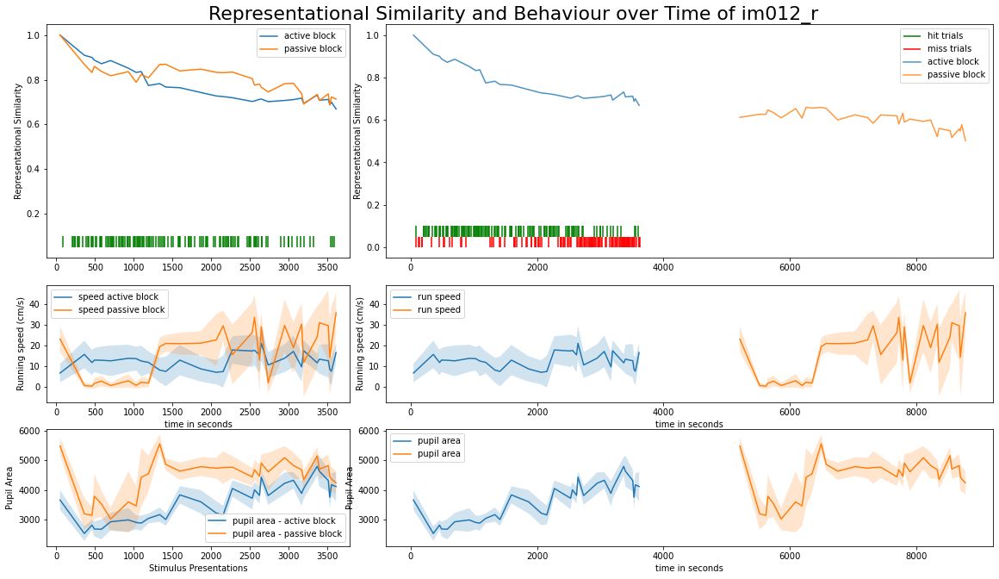

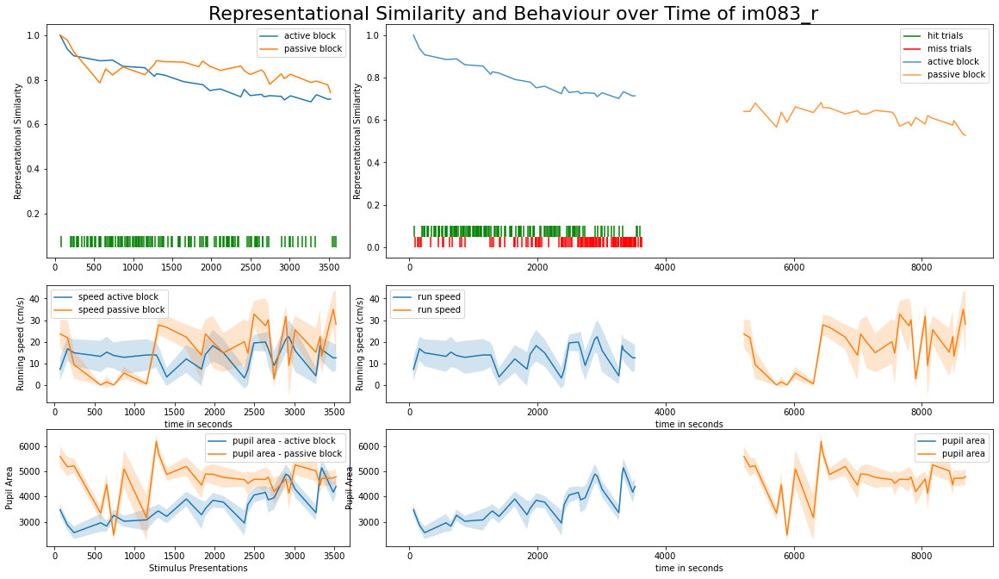

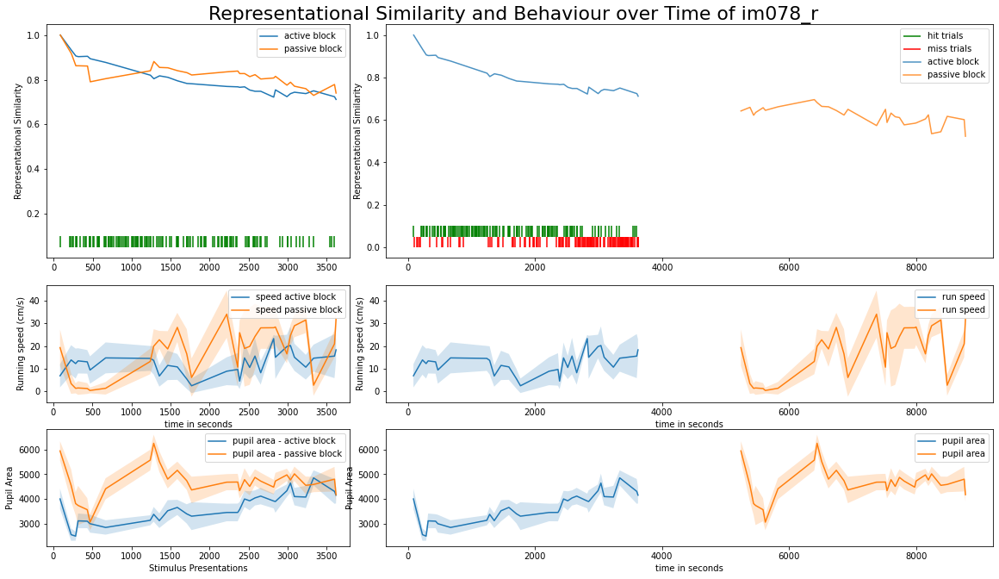

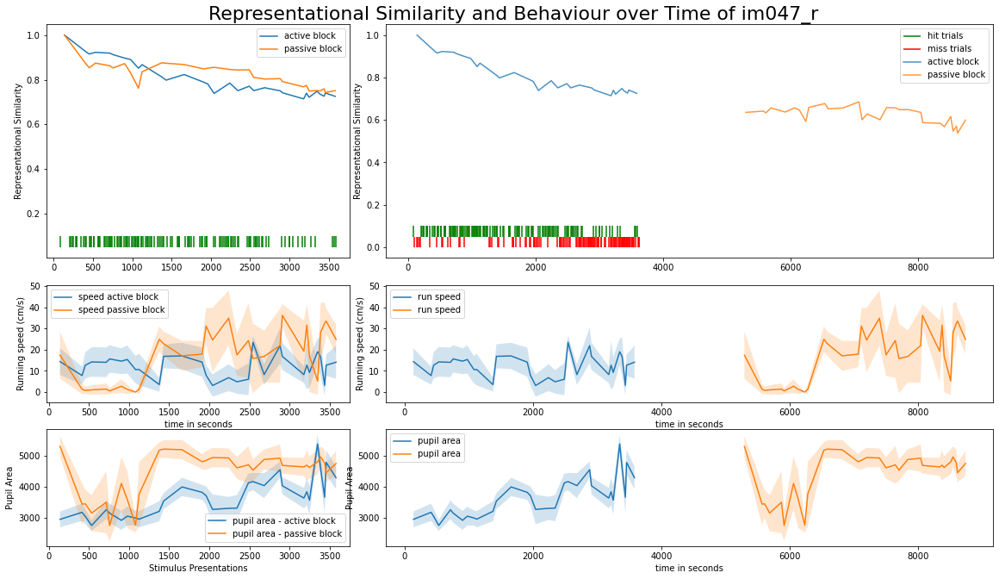

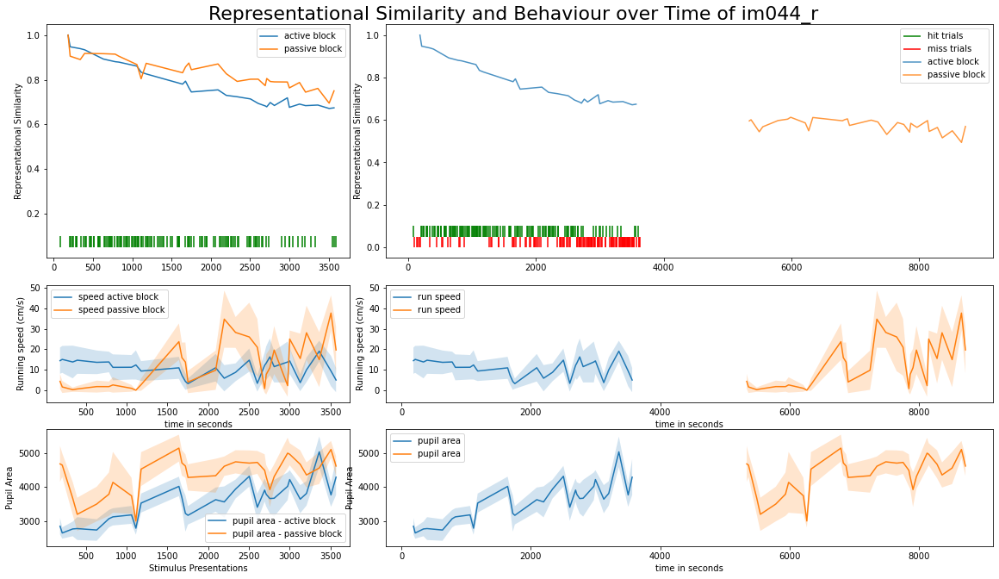

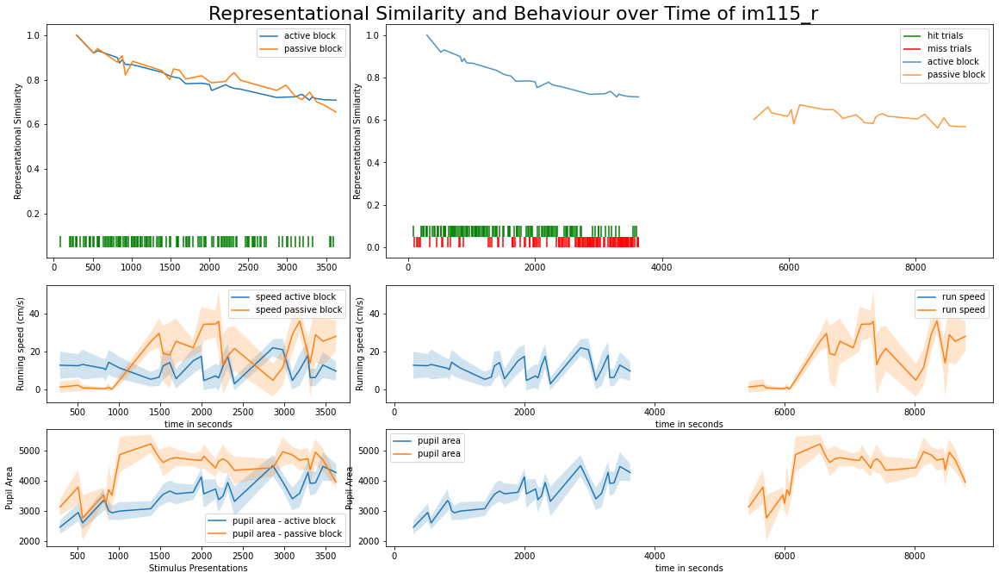

In [25]:
# print all images full information

for image in valid_images:
    specific_image(image, M_all_good, stimulus_presentations, running_speed, eye_tracking, change_trials)
    
    

#  2. Add CHAINS column to stimulus_presentations table

In [26]:
im_chains = count_all_same_image_appearences(stimulus_presentations)
stimulus_presentations['image_chain'] = im_chains
im111_sp = stimulus_presentations[stimulus_presentations['image_name']=='im111_r']
len(im111_sp[im111_sp['image_chain']==3.0])


48

#  3. Representational Similarity vs. delta V (behaviour)

In [27]:
from itertools import combinations, product

for pair in combinations(range(6), 2):
    i, j = pair
    print(i,j)
    
    
print('product: ')
a = range(3)
b = range(3, 6)
for pair in product(a,b):
    i, j = pair
    print(i,j)
    

0 1
0 2
0 3
0 4
0 5
1 2
1 3
1 4
1 5
2 3
2 4
2 5
3 4
3 5
4 5
product: 
0 3
0 4
0 5
1 3
1 4
1 5
2 3
2 4
2 5


In [28]:
# TODO: Regression and differentiation between active and passive block

15933 15933


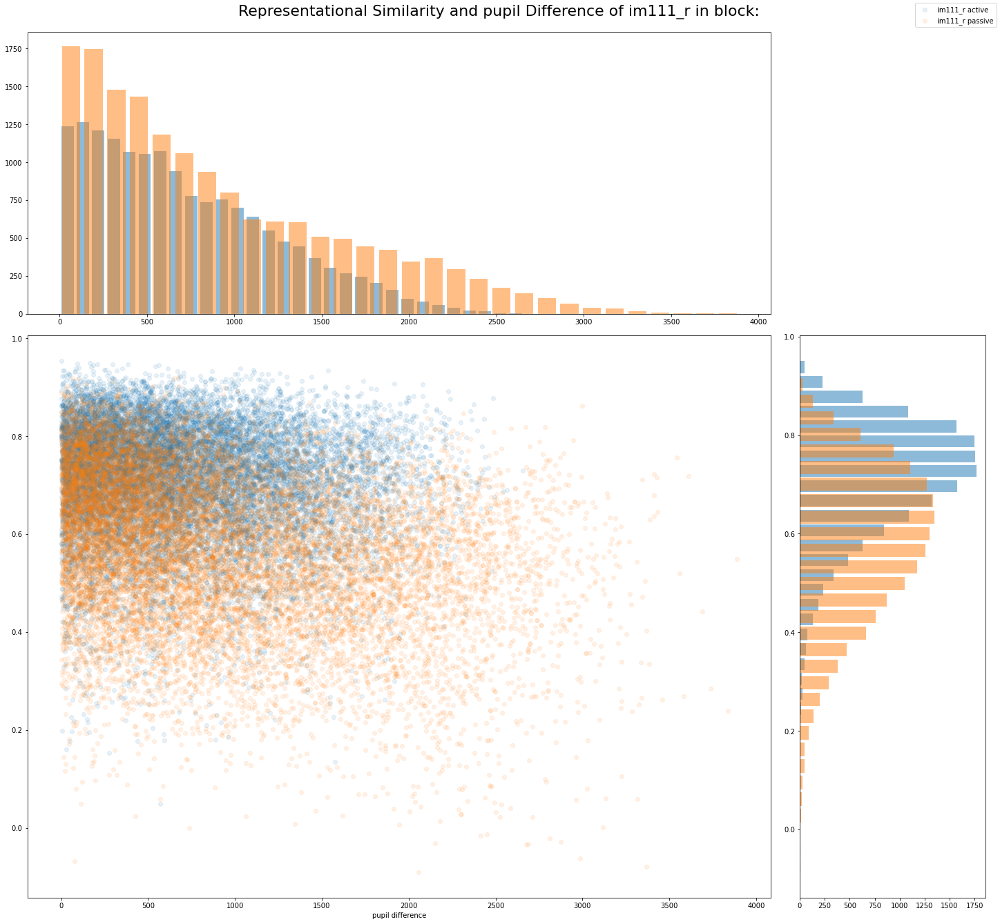

In [108]:
RS_vs_speed_active_passive('im111_r', M_good_VISp, stimulus_presentations, running_speed, eye_tracking,'pupil', '')


In [32]:
running_speed.speed

0          2.636642
1          5.141593
2          7.400741
3          9.313604
4         10.818199
            ...    
519711    22.900891
519712    24.031765
519713    25.333005
519714    26.770965
519715    28.284810
Name: speed, Length: 519716, dtype: float64

number of data points:  58
im111_r
number of data points:  58
im111_r


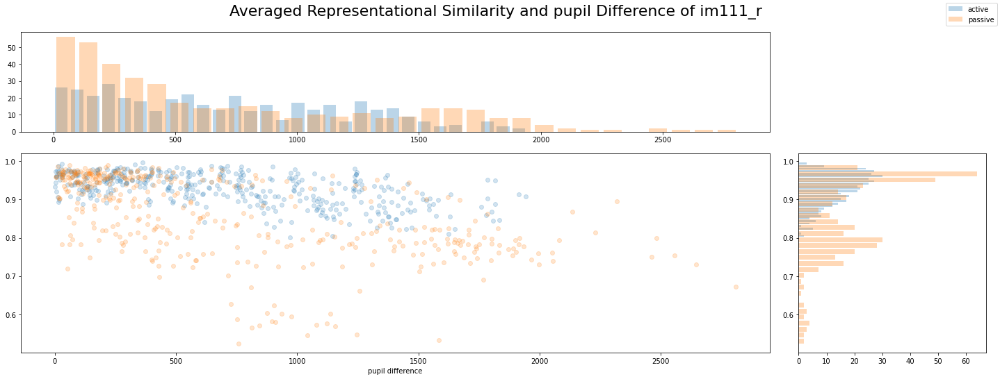

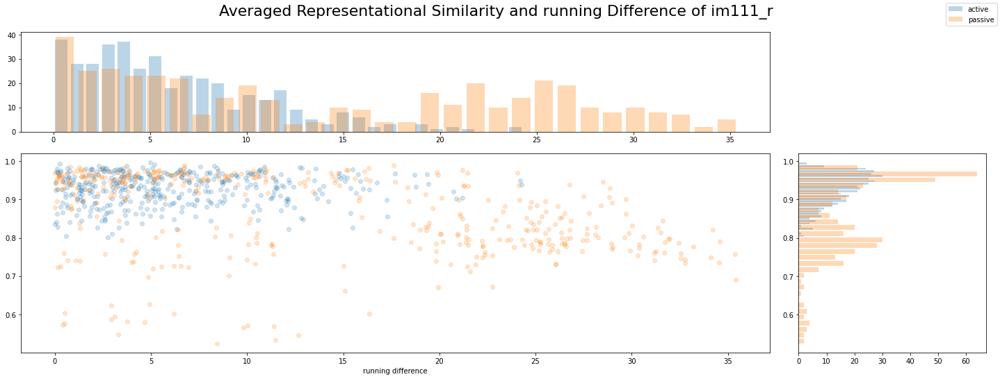

In [33]:
RS_vs_speed_avg_active_passive('im111_r', M_good_VISp, stimulus_presentations, running_speed, eye_tracking, 'pupil')
RS_vs_speed_avg_active_passive('im111_r', M_good_VISp, stimulus_presentations, running_speed, eye_tracking, 'running')

#  4. Representational Similarity vs. Time Difference

In [34]:
# TODO? here also running speed ?

total number of data points:  58
im111_r


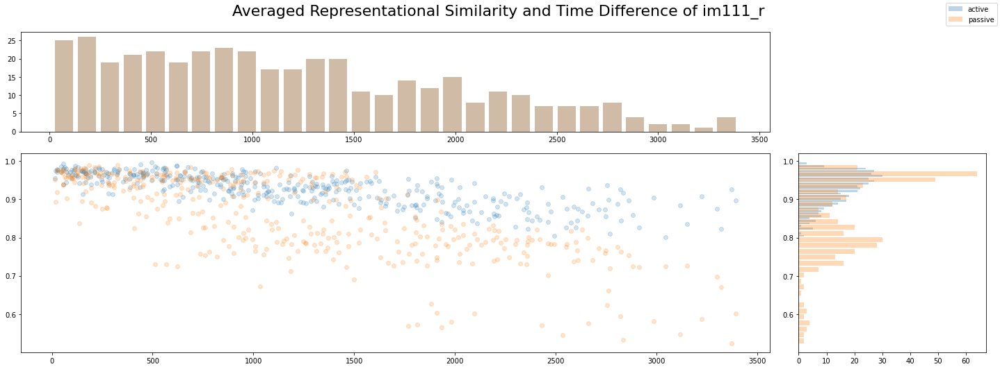

In [35]:
RS_vs_time_avg_active_passive('im111_r', M_good_VISp, stimulus_presentations)

In [36]:
# TODO Time Difference vs Similarity for unavageraged data:
# AND consolidate all the functions, to try different session
# Take care of the Presentation slides /all needed plots